In [89]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import seaborn as sns

In [50]:
customer_df=pd.read_csv("/content/customer_info.csv")
print(customer_df)

       Unnamed: 0  customer_id       customer_name customer_gender  \
0               0        39634         David Frink            male   
1               1        43460       Belinda Terry          female   
2               2        23937       Evelyn Calico          female   
3               3         2431         Ora Boggess          female   
4               4        10090       Lonnie Hopson            male   
...           ...          ...                 ...             ...   
43626       43626        48487     Amelia Crawford          female   
43627       43627        24856        Silvia Ramos          female   
43628       43628        21373       Addie Coronel          female   
43629       43629        19527      Msc. Mary Ross          female   
43630       43630         5120  Bsc. Milton Friend            male   

        customer_birthdate  kids_home  teens_home  number_complaints  \
0      05/15/1964 10:34 PM        1.0         1.0                1.0   
1      03/26/19

In [52]:
dat=customer_df.copy()
print(dat)

       Unnamed: 0  customer_id       customer_name customer_gender  \
0               0        39634         David Frink            male   
1               1        43460       Belinda Terry          female   
2               2        23937       Evelyn Calico          female   
3               3         2431         Ora Boggess          female   
4               4        10090       Lonnie Hopson            male   
...           ...          ...                 ...             ...   
43626       43626        48487     Amelia Crawford          female   
43627       43627        24856        Silvia Ramos          female   
43628       43628        21373       Addie Coronel          female   
43629       43629        19527      Msc. Mary Ross          female   
43630       43630         5120  Bsc. Milton Friend            male   

        customer_birthdate  kids_home  teens_home  number_complaints  \
0      05/15/1964 10:34 PM        1.0         1.0                1.0   
1      03/26/19

In [64]:
dat.drop(columns=["Unnamed: 0","customer_name"],inplace=True)

In [53]:
dat.set_index("customer_id",inplace=True)

In [54]:
print(dat)

             Unnamed: 0       customer_name customer_gender  \
customer_id                                                   
39634                 0         David Frink            male   
43460                 1       Belinda Terry          female   
23937                 2       Evelyn Calico          female   
2431                  3         Ora Boggess          female   
10090                 4       Lonnie Hopson            male   
...                 ...                 ...             ...   
48487             43626     Amelia Crawford          female   
24856             43627        Silvia Ramos          female   
21373             43628       Addie Coronel          female   
19527             43629      Msc. Mary Ross          female   
5120              43630  Bsc. Milton Friend            male   

              customer_birthdate  kids_home  teens_home  number_complaints  \
customer_id                                                                  
39634        05/15/1964 

In [55]:
dat["customer_gender"]=dat["customer_gender"].apply(lambda x: 1 if x == "male" else 0)
print(dat)

             Unnamed: 0       customer_name  customer_gender  \
customer_id                                                    
39634                 0         David Frink                1   
43460                 1       Belinda Terry                0   
23937                 2       Evelyn Calico                0   
2431                  3         Ora Boggess                0   
10090                 4       Lonnie Hopson                1   
...                 ...                 ...              ...   
48487             43626     Amelia Crawford                0   
24856             43627        Silvia Ramos                0   
21373             43628       Addie Coronel                0   
19527             43629      Msc. Mary Ross                0   
5120              43630  Bsc. Milton Friend                1   

              customer_birthdate  kids_home  teens_home  number_complaints  \
customer_id                                                                  
39634      

In [56]:
dat["customer_birthdate"]=pd.to_datetime(dat["customer_birthdate"])

<ipython-input-56-ab5271dc9894>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dat["customer_birthdate"]=pd.to_datetime(dat["customer_birthdate"])


In [57]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43631 entries, 39634 to 5120
Data columns (total 25 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Unnamed: 0                               43631 non-null  int64         
 1   customer_name                            43631 non-null  object        
 2   customer_gender                          43631 non-null  int64         
 3   customer_birthdate                       43631 non-null  datetime64[ns]
 4   kids_home                                43107 non-null  float64       
 5   teens_home                               42610 non-null  float64       
 6   number_complaints                        42977 non-null  float64       
 7   distinct_stores_visited                  42322 non-null  float64       
 8   lifetime_spend_groceries                 43631 non-null  float64       
 9   lifetime_spend_electronics               

In [46]:
today=datetime.today()

In [58]:
dat["age"]=today.year-dat["customer_birthdate"].dt.year
print(dat)

             Unnamed: 0       customer_name  customer_gender  \
customer_id                                                    
39634                 0         David Frink                1   
43460                 1       Belinda Terry                0   
23937                 2       Evelyn Calico                0   
2431                  3         Ora Boggess                0   
10090                 4       Lonnie Hopson                1   
...                 ...                 ...              ...   
48487             43626     Amelia Crawford                0   
24856             43627        Silvia Ramos                0   
21373             43628       Addie Coronel                0   
19527             43629      Msc. Mary Ross                0   
5120              43630  Bsc. Milton Friend                1   

             customer_birthdate  kids_home  teens_home  number_complaints  \
customer_id                                                                 
39634       1

In [59]:
print(dat["loyalty_card_number"].isnull().sum()/len(dat["loyalty_card_number"]))

0.4349430450826247


In [60]:
dat["loyalty_card_number"]

customer_id
39634         NaN
43460         NaN
23937    951127.0
2431     958680.0
10090    977059.0
           ...   
48487         NaN
24856    909859.0
21373         NaN
19527    933102.0
5120     916045.0
Name: loyalty_card_number, Length: 43631, dtype: float64

In [62]:
dat["loyalty_card_number"]=np.where(dat["loyalty_card_number"].isnull(), 0, 1)

In [63]:
dat["loyalty_card_number"]

customer_id
39634    0
43460    0
23937    1
2431     1
10090    1
        ..
48487    0
24856    1
21373    0
19527    1
5120     1
Name: loyalty_card_number, Length: 43631, dtype: int64

In [65]:
print(dat)

             customer_gender  customer_birthdate  kids_home  teens_home  \
customer_id                                                               
39634                      1 1964-05-15 22:34:00        1.0         1.0   
43460                      0 1988-03-26 23:06:00        1.0         0.0   
23937                      0 1969-04-13 18:07:00        0.0         1.0   
2431                       0 1941-06-15 03:26:00        0.0         0.0   
10090                      1 2001-12-18 03:03:00        0.0         0.0   
...                      ...                 ...        ...         ...   
48487                      0 1983-08-28 11:43:00        1.0         1.0   
24856                      0 1992-09-21 19:16:00        1.0         1.0   
21373                      0 1994-02-20 05:58:00        0.0         0.0   
19527                      0 1989-08-06 16:39:00        1.0         0.0   
5120                       1 1957-06-19 10:53:00        2.0         0.0   

             number_comp

In [66]:
import geopandas as gpd
from shapely.geometry import Point

In [67]:
dat["geometry"] = dat.apply(lambda x: Point((float(x.longitude), float(x.latitude))), axis=1)

In [68]:
gdf = gpd.GeoDataFrame(dat, geometry="geometry")

In [69]:
print(gdf)

             customer_gender  customer_birthdate  kids_home  teens_home  \
customer_id                                                               
39634                      1 1964-05-15 22:34:00        1.0         1.0   
43460                      0 1988-03-26 23:06:00        1.0         0.0   
23937                      0 1969-04-13 18:07:00        0.0         1.0   
2431                       0 1941-06-15 03:26:00        0.0         0.0   
10090                      1 2001-12-18 03:03:00        0.0         0.0   
...                      ...                 ...        ...         ...   
48487                      0 1983-08-28 11:43:00        1.0         1.0   
24856                      0 1992-09-21 19:16:00        1.0         1.0   
21373                      0 1994-02-20 05:58:00        0.0         0.0   
19527                      0 1989-08-06 16:39:00        1.0         0.0   
5120                       1 1957-06-19 10:53:00        2.0         0.0   

             number_comp

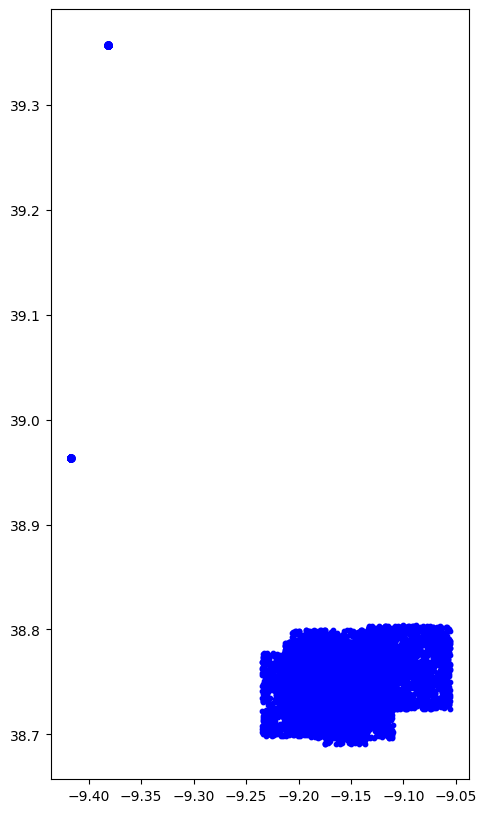

In [71]:
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, color='blue', markersize=10)
plt.show()

In [79]:
dat.drop(columns=["geometry"],inplace=True)

In [82]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43631 entries, 39634 to 5120
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   customer_gender                          43631 non-null  int64  
 1   kids_home                                43107 non-null  float64
 2   teens_home                               42610 non-null  float64
 3   number_complaints                        42977 non-null  float64
 4   distinct_stores_visited                  42322 non-null  float64
 5   lifetime_spend_groceries                 43631 non-null  float64
 6   lifetime_spend_electronics               43631 non-null  float64
 7   typical_hour                             41886 non-null  float64
 8   lifetime_spend_vegetables                42758 non-null  float64
 9   lifetime_spend_nonalcohol_drinks         43631 non-null  float64
 10  lifetime_spend_alcohol_drinks            43631 n

In [83]:
data["year_first_transaction"].isnull().sum()

0

In [85]:
dat["customer_relationship_year"]=today.year-dat["year_first_transaction"]
print(dat)

             customer_gender  kids_home  teens_home  number_complaints  \
customer_id                                                              
39634                      1        1.0         1.0                1.0   
43460                      0        1.0         0.0                1.0   
23937                      0        0.0         1.0                1.0   
2431                       0        0.0         0.0                0.0   
10090                      1        0.0         0.0                0.0   
...                      ...        ...         ...                ...   
48487                      0        1.0         1.0                0.0   
24856                      0        1.0         1.0                1.0   
21373                      0        0.0         0.0                0.0   
19527                      0        1.0         0.0                1.0   
5120                       1        2.0         0.0                2.0   

             distinct_stores_visited 

In [86]:
dat.drop(columns=["year_first_transaction"],inplace=True)

In [88]:
dat["number_complaints"].info()
dat["number_complaints"].describe()

<class 'pandas.core.series.Series'>
Index: 43631 entries, 39634 to 5120
Series name: number_complaints
Non-Null Count  Dtype  
--------------  -----  
42977 non-null  float64
dtypes: float64(1)
memory usage: 681.7 KB


count    42977.000000
mean         0.705726
std          0.624624
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          9.000000
Name: number_complaints, dtype: float64

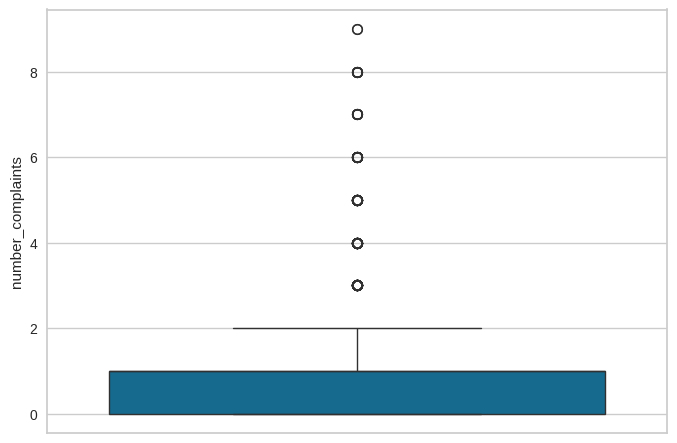

In [90]:
sns.boxplot(dat["number_complaints"])
plt.show()

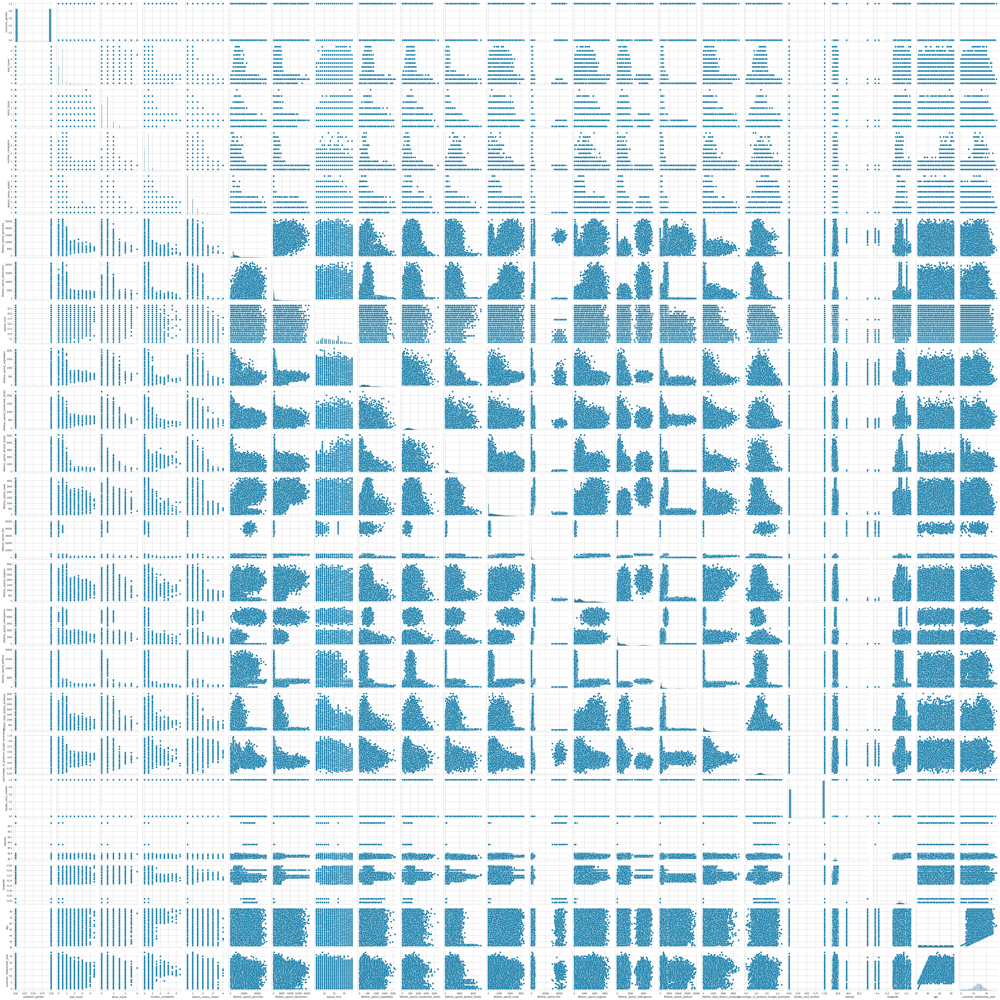

In [92]:
sns.pairplot(dat)
plt.show()

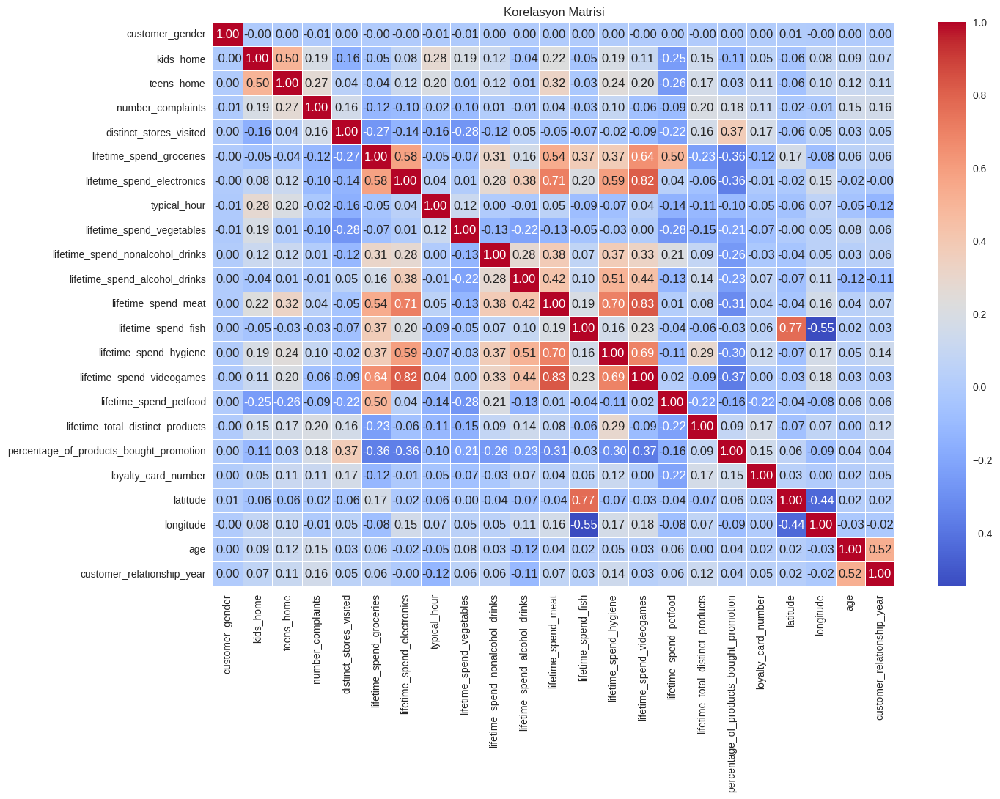

In [95]:
korelasyon_matrisi = dat.corr()


plt.figure(figsize=(15, 10))
sns.heatmap(korelasyon_matrisi, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Korelasyon Matrisi")
plt.show()

In [127]:
dat.isnull().sum()


customer_gender                               0
kids_home                                   524
teens_home                                 1021
number_complaints                           654
distinct_stores_visited                    1309
lifetime_spend_groceries                      0
lifetime_spend_electronics                    0
typical_hour                               1745
lifetime_spend_vegetables                   873
lifetime_spend_nonalcohol_drinks              0
lifetime_spend_alcohol_drinks                 0
lifetime_spend_meat                           0
lifetime_spend_fish                        1309
lifetime_spend_hygiene                        0
lifetime_spend_videogames                     0
lifetime_spend_petfood                        0
lifetime_total_distinct_products              0
percentage_of_products_bought_promotion       0
loyalty_card_number                           0
latitude                                      0
longitude                               

In [102]:
dat["number_complaints"].isnull().sum()

654

In [101]:
dat["number_complaints"].value_counts()

number_complaints
1.0    24908
0.0    15591
2.0     2277
3.0       75
4.0       51
5.0       40
6.0       18
8.0        8
7.0        7
9.0        2
Name: count, dtype: int64

In [128]:
dat["loyalty_card_number"].info()

<class 'pandas.core.series.Series'>
Index: 43631 entries, 39634 to 5120
Series name: loyalty_card_number
Non-Null Count  Dtype
--------------  -----
43631 non-null  int64
dtypes: int64(1)
memory usage: 681.7 KB


In [130]:
print(dat)

             customer_gender  kids_home  teens_home  number_complaints  \
customer_id                                                              
39634                      1        1.0         1.0                1.0   
43460                      0        1.0         0.0                1.0   
23937                      0        0.0         1.0                1.0   
2431                       0        0.0         0.0                0.0   
10090                      1        0.0         0.0                0.0   
...                      ...        ...         ...                ...   
48487                      0        1.0         1.0                0.0   
24856                      0        1.0         1.0                1.0   
21373                      0        0.0         0.0                0.0   
19527                      0        1.0         0.0                1.0   
5120                       1        2.0         0.0                2.0   

             distinct_stores_visited 

In [131]:
dat.rename(columns={
    "loyalty_card_number":"loyalyt_card_have"},inplace=True)

In [132]:
print(dat)

             customer_gender  kids_home  teens_home  number_complaints  \
customer_id                                                              
39634                      1        1.0         1.0                1.0   
43460                      0        1.0         0.0                1.0   
23937                      0        0.0         1.0                1.0   
2431                       0        0.0         0.0                0.0   
10090                      1        0.0         0.0                0.0   
...                      ...        ...         ...                ...   
48487                      0        1.0         1.0                0.0   
24856                      0        1.0         1.0                1.0   
21373                      0        0.0         0.0                0.0   
19527                      0        1.0         0.0                1.0   
5120                       1        2.0         0.0                2.0   

             distinct_stores_visited 

In [ ]:
ref_lat = 38.736946
ref_lon = -9.142685

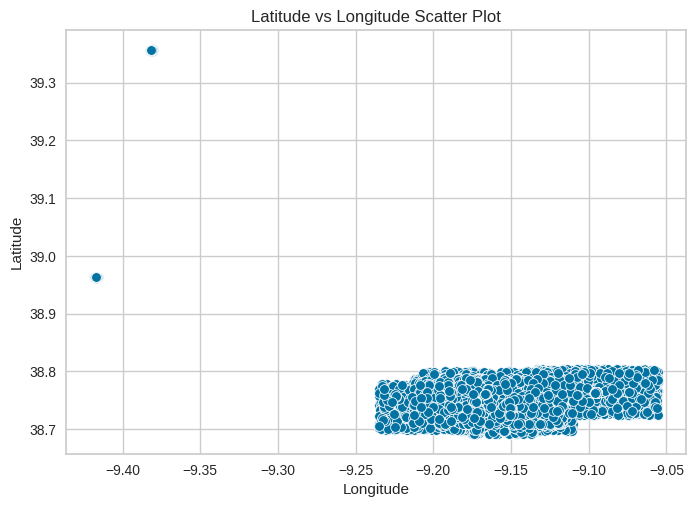

In [133]:
sns.scatterplot(data=dat,x="longitude",y="latitude")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Latitude vs Longitude Scatter Plot')
plt.show()

In [135]:
!pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 23.0 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


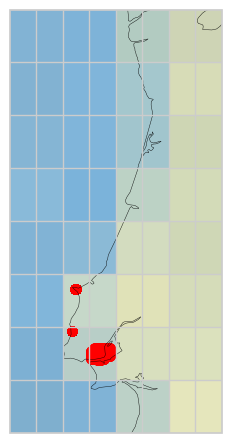

In [136]:
import cartopy.crs as ccrs
import cartopy.crs as ccrs
import cartopy.feature as cfeature
ax = plt.axes(projection=ccrs.PlateCarree())

# Add the satellite image as the background of the map
ax.stock_img()
# Set the map extent to the area of interest
ax.add_feature(cfeature.BORDERS)

# Add coastline
ax.coastlines()

# Add the map of Portugal
extent = [-10, -8, 38, 42]  # [min_longitude, max_longitude, min_latitude, max_latitude]
ax.set_extent(extent)

# Add gridlines
ax.gridlines()

# Plot the scatters on the map
plt.scatter(
    dat.longitude,
    dat.latitude,
    transform=ccrs.PlateCarree(), color='red', marker='o'
    )

In [138]:
import math

we are gonna crate distance of city center. (38.736946 ---- -9.142685)

In [153]:
ref_lat = 38.736946
ref_lon = -9.142685

mesafeler=[]

for index,row in dat.iterrows():
  mesafe=np.sqrt((row["latitude"] - ref_lat)**2 + (row["longitude"] - ref_lon)**2)
  mesafeler.append(mesafe)

In [155]:
len(mesafeler)
mesafeler=pd.DataFrame(mesafeler)

In [162]:
print(mesafeler.isnull().sum())

0    0
dtype: int64


In [166]:
print(mesafeler)

              0
0      0.006519
1      0.031490
2      0.029723
3      0.045863
4      0.047939
...         ...
43626  0.033382
43627  0.033444
43628  0.050970
43629  0.039948
43630  0.035649

[43631 rows x 1 columns]


In [167]:
dat.reset_index(inplace=True)

In [169]:
dat["distance_center"]=mesafeler



In [170]:
print(dat)

       customer_id  customer_gender  kids_home  teens_home  number_complaints  \
0            39634                1        1.0         1.0                1.0   
1            43460                0        1.0         0.0                1.0   
2            23937                0        0.0         1.0                1.0   
3             2431                0        0.0         0.0                0.0   
4            10090                1        0.0         0.0                0.0   
...            ...              ...        ...         ...                ...   
43626        48487                0        1.0         1.0                0.0   
43627        24856                0        1.0         1.0                1.0   
43628        21373                0        0.0         0.0                0.0   
43629        19527                0        1.0         0.0                1.0   
43630         5120                1        2.0         0.0                2.0   

       distinct_stores_visi

In [171]:
print(dat["distance_center"].isnull().sum())

0


In [172]:
print(dat["typical_hour"].describe())

count    41886.000000
mean        13.520580
std          4.558057
min          6.000000
25%         10.000000
50%         13.000000
75%         17.000000
max         24.000000
Name: typical_hour, dtype: float64


In [173]:
print(dat["typical_hour"].isnull().sum()/len(dat))

0.03999449932387523


In [174]:
dat["typical_hour"].isnull().sum()

1745

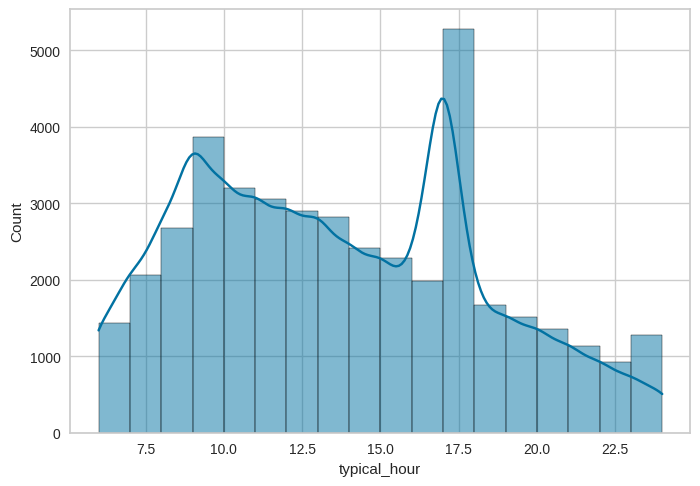

In [177]:
sns.histplot(data=dat, x="typical_hour", bins=18, kde=True)
plt.show()

In [181]:
dat["typical_hour"].value_counts().sort_index()

typical_hour
6.0     1441
7.0     2057
8.0     2683
9.0     3870
10.0    3206
11.0    3057
12.0    2899
13.0    2826
14.0    2417
15.0    2284
16.0    1984
17.0    5275
18.0    1673
19.0    1518
20.0    1355
21.0    1140
22.0     920
23.0     726
24.0     555
Name: count, dtype: int64

In [182]:
dat.isnull().sum()

customer_id                                   0
customer_gender                               0
kids_home                                   524
teens_home                                 1021
number_complaints                           654
distinct_stores_visited                    1309
lifetime_spend_groceries                      0
lifetime_spend_electronics                    0
typical_hour                               1745
lifetime_spend_vegetables                   873
lifetime_spend_nonalcohol_drinks              0
lifetime_spend_alcohol_drinks                 0
lifetime_spend_meat                           0
lifetime_spend_fish                        1309
lifetime_spend_hygiene                        0
lifetime_spend_videogames                     0
lifetime_spend_petfood                        0
lifetime_total_distinct_products              0
percentage_of_products_bought_promotion       0
loyalyt_card_have                             0
latitude                                

In [195]:
dat.distinct_stores_visited.sum()

70676.0

In [187]:
c_basket=pd.read_csv("/content/customer_basket.csv")

In [194]:
print(c_basket.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89952 entries, 0 to 89951
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   invoice_id     89952 non-null  int64 
 1   list_of_goods  89952 non-null  object
 2   customer_id    89952 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 2.1+ MB
None


In [192]:
d_43134 = c_basket[c_basket["customer_id"]== 43134]

In [193]:
d_43134

,invoice_id,list_of_goods,customer_id
0,7448187,"['olive oil', 'yogurt cake', 'grated cheese', ...",43134
1,3167314,"['babies food', 'shower gel', 'rice', 'black b...",43134
2,10199712,"['babies food', 'barbecue sauce', 'olive oil',...",43134
3,12179179,"['babies food', 'milk', 'rice', 'yogurt cake',...",43134
4,8292388,"['napkins', 'cookies', 'razor', 'cooking oil',...",43134
5,11607908,"['green beans', 'toilet paper', 'yogurt cake',...",43134


In [198]:
print(dat[dat["customer_id"]==43134])

       customer_id  customer_gender  kids_home  teens_home  number_complaints  \
15305        43134                0        1.0         1.0                1.0   

       distinct_stores_visited  lifetime_spend_groceries  \
15305                      2.0                    2132.0   

       lifetime_spend_electronics  typical_hour  lifetime_spend_vegetables  \
15305                       290.0           9.0                      151.0   

       ...  lifetime_spend_videogames  lifetime_spend_petfood  \
15305  ...                      277.0                   482.0   

       lifetime_total_distinct_products  \
15305                             678.0   

       percentage_of_products_bought_promotion  loyalyt_card_have   latitude  \
15305                                  0.51358                  0  38.777774   

       longitude  age  customer_relationship_year  distance_center  
15305  -9.122801   56                        17.0         0.045413  

[1 rows x 25 columns]
